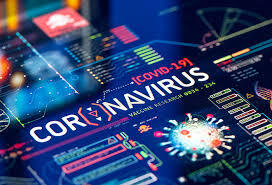

A coronavirus disease (COVID) is a disease caused by members of the coronavirus (CoV) family.

The severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2) causes coronavirus disease 2019 (COVID-19), which in December 2019 led to a pneumonia outbreak in Wuhan, China, which developed into the COVID-19 pandemic.

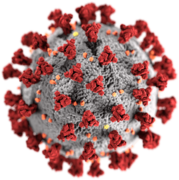
1) An Illustration of Covid-19 Molecule
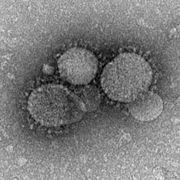
2) Covid-19 strain as seen by a microscope

In [82]:

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from scipy.optimize import curve_fit
import os

# Input data files are available in the '/kaggle/input' or '../../../datasets/extracts/' directory.
file_input=['/kaggle/input','../../../datasets/extracts/']
files={}
for dirname, _, filenames in os.walk(file_input[0]):
    for filename in filenames:
        print(dirname,filename)
        if 'csv' in filename:
            files[filename.replace('.csv','')]=os.path.join(dirname, filename)
            print(filename.replace('.csv',''))

In [83]:
IndiaDF = pd.read_csv('D:\Machine_Learn\Lab1\Spark_Project\covid_19_india.csv',
                      converters={
                          'ConfirmedIndianNational':lambda row: (row.replace('-','0')),
                          'ConfirmedForeignNational':lambda row: (row.replace('-','0')),
                          'Deaths':lambda row: int(''.join(filter(str.isdigit,row))) if row !='' else 0
                      })
IndiaDF = IndiaDF.rename({'State/UnionTerritory':'State','Cured':'Recovered'},axis=1)
IndiaDF['Active'] = IndiaDF['Confirmed'] - ( IndiaDF['Recovered']+ IndiaDF['Deaths'])
IndiaDF.head()

,Sno,Date,Time,State,ConfirmedIndianNational,ConfirmedForeignNational,Recovered,Deaths,Confirmed,Active
0,1,30/01/20,6:00 PM,Kerala,1,0,0,0,1,1
1,2,31/01/20,6:00 PM,Kerala,1,0,0,0,1,1
2,3,01/02/20,6:00 PM,Kerala,2,0,0,0,2,2
3,4,02/02/20,6:00 PM,Kerala,3,0,0,0,3,3
4,5,03/02/20,6:00 PM,Kerala,3,0,0,0,3,3


<p> _____________________________________________________________________________________________
   
<font size = '5'> Let's visualize how the Count of Recovered, Active, Total and Deaths have fared up with the passing no. of days </font>
</p>______________________________________________________________________________________________

In [84]:
IndiaDF['Date'] = pd.to_datetime(IndiaDF['Date'],format='%d/%m/%y')
IndiaDF.sort_values('Date',inplace=True)
IndiaTotalDF = IndiaDF[['Date','Recovered','Deaths','Active','Confirmed']].groupby('Date').sum().reset_index()

fig = px.line(pd.melt(IndiaTotalDF,id_vars=['Date'], var_name='Value Type', value_name='Count'),
            x = 'Date',
            y = 'Count',
            color = 'Value Type',
            line_shape='spline',
            template='plotly_dark',
            title='Reported cases in India over Time')
fig.update_layout(yaxis={'type':'linear'})
fig.show()

______________________________________________________________________________________________________
As we can see from the above graph that the covid graph is rising exponentially for all the fields except for Death which is ofcourse a good thing. 
So there gradually arises a question is the covid-19 pandemic even in control in our country?

For that let's plot a live bar chart which shows how our various fields go with each passing day.
_______________________________________________________________________________________________________

In [85]:
columns=['Active','Recovered','Deaths']
IndiaPercDF=IndiaTotalDF.set_index('Date')[columns]
IndiaPercDF=IndiaPercDF.div(IndiaPercDF.sum(axis=1), axis=0).multiply(100)
IndiaPercDF.reset_index(inplace=True)

fig=go.Figure(data=go.Pie(labels=columns,
                values=[IndiaPercDF.iloc[IndiaPercDF['Date'].idxmax(axis=1)]['Active'],
                        IndiaPercDF.iloc[IndiaPercDF['Date'].idxmax(axis=1)]['Recovered'],
                       IndiaPercDF.iloc[IndiaPercDF['Date'].idxmax(axis=1)]['Deaths']
                       ]),layout={'template':'plotly_dark'})
fig.update_layout(title_text="Coronavirus Cases in India a/o "+IndiaTotalDF['Date'].max().strftime("%d-%b'%y"))
fig.show()

meltedDF=pd.melt(IndiaPercDF[columns[::-1]+['Date']],id_vars=['Date'], var_name='Value Type', value_name='Share Percentage')
fig = px.bar(meltedDF, 
       x = "Share Percentage",
       animation_frame = meltedDF['Date'].astype(str), 
       color = 'Value Type', 
       barmode = 'stack', height=400,
       template='plotly_dark',
       title='Cases percentage share over time',
       orientation='h')
fig.show()

_______________________________________________________________________________________________________
Now let's check how the no. of cases change with each passing day
_______________________________________________________________________________________________________

In [86]:
DeltaColumns = ['Date','Confirmed', 'Recovered', 'Deaths']
fig = px.line(pd.melt((IndiaTotalDF[DeltaColumns].set_index('Date').diff()).reset_index(),id_vars=['Date'], var_name='Value Type', value_name='Count'),
            x = 'Date',
            y = 'Count',line_shape='spline',
            color = 'Value Type',
            template = 'plotly_dark',
            title='Cases per Day')
fig.update_layout(yaxis={'type':'linear'})
fig.show()

fig = px.line(pd.melt((IndiaTotalDF[DeltaColumns].set_index('Date').ewm(span=14).mean().diff()).reset_index(),id_vars=['Date'], var_name='Value Type', value_name='Count'),
            x = 'Date',
            y = 'Count',line_shape='spline',
            color = 'Value Type',
            template = 'plotly_dark',
            title='Exponential Weight 14 days Mean Cases per Day')
fig.update_layout(yaxis={'type':'linear'})
fig.show()

fig = px.line(pd.melt((IndiaTotalDF[DeltaColumns].set_index('Date').pct_change().ewm(span=14).mean()).reset_index(),id_vars=['Date'], var_name='Value Type', value_name='Count'),
            x = 'Date',
            y = 'Count',line_shape='spline',
            color = 'Value Type',
            template = 'plotly_dark',  
            title='Percentage Change per day with EWM 14 days mean')
fig.update_layout(yaxis={'type':'linear'})
fig.show()

__________________________________________________________________________________________________
Recovered delta rate is more than Confirmed delta cases, hence proving that if current situation continues, India will be able to fully recover through Covid Situation
__________________________________________________________________________________________________

In [87]:
IndianStatesDF = IndiaDF.sort_values(['State','Date']).drop_duplicates('State', keep='last')[['State','Recovered','Deaths','Confirmed','Active']]
IndianStatesDF['State'] = IndianStatesDF['State'].str.replace('#','')
IndianStatesDF = IndianStatesDF.groupby('State').sum().reset_index()

for item in columns:
    fig = px.treemap(IndianStatesDF,
                     path = ['State'],
                     values = item,
                     color = item,
                     title = item + ' cases on different states',
                     template = 'plotly_dark')
    fig.show()

ZeroDivisionError: Weights sum to zero, can't be normalized

In [88]:
# Converting absolute values into percentage share
IndiaStateDF = IndiaDF.set_index(['Date','State'])[['Recovered','Deaths','Active']]
IndiaStateDF = IndiaStateDF.div(IndiaStateDF.sum(axis=1), axis=0).multiply(100)                          
IndiaStateDF.reset_index(inplace=True)
IndiaStateDF.sort_values('Date',inplace=True)

# Ranking the starting point of each States as 1st day for the the respective state
IndiaStateRankDF = pd.concat([IndiaStateDF,
           IndiaStateDF.groupby('State')['Date'].rank("dense",ascending=True).rename('Days')],
          axis=1)

# Bar chart race for showing contries infection rate over time (showing 10 ten at a time)
plt.rcParams["animation.html"] = "jshtml"
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot()
confirmed_col = 'Recovered'

colors = dict(zip(
    IndiaStateRankDF['State'].unique(),
    cm.rainbow(np.linspace(0,1,len(IndiaStateRankDF['State'].unique()))
)))

def draw_barchart(current_year):
    dff = IndiaStateRankDF[(IndiaStateRankDF['Date'].eq(current_year))].sort_values(by=[confirmed_col,'State'], ascending=True).tail(10).fillna(0)
    
    ax.clear()
    ax.barh(dff['State'], dff[confirmed_col], color=[colors[x] for x in dff['State']])
    dx = dff[confirmed_col].max() / 100
    
    for i, (value, name) in enumerate(zip(dff[confirmed_col], dff['State'])):
        ax.text(value-dx, i,     name,             size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')

    ax.text(1, 0, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, confirmed_col, transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'+'%'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Recovered Rate(%) over Time',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, -0.1, 'by @tanmay_00pardhi', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    plt.close()
    
# animating each frame of matplotlib chart using Funcanimation
animator = animation.FuncAnimation(fig, 
                                   draw_barchart, 
                                   frames=pd.date_range(start=IndiaStateRankDF[IndiaStateRankDF['Recovered']>0]['Date'].min(),
                                                        end=IndiaStateRankDF['Date'].max(),
                                                        freq='D').strftime('%Y-%m-%d'),
                                                        repeat=False,
                                                        cache_frame_data=True,
                                    interval=500)
animator

In [89]:
ICMRdf = pd.read_csv('D:\Machine_Learn\Lab1\Spark_Project\ICMRTestingLabs.csv')
ICMRdf['type'] = ICMRdf['type'].str.replace('Laboratory','Lab')

fig = px.treemap(ICMRdf.groupby(['state','city','type'])['lab'].count().rename('count').reset_index(),
                 path=['state','city','type'],
                 values='count',
                 color='count',
                 title='ICMR Testing Labs in India',
                 height=700,
                 template='plotly_dark')
fig.update_layout(annotations= [{
    'text': "Click on State name/City name to deep dive",
      'font': {
      'size': 13,
      'color': 'rgb(256, 256, 256)',
    },
    'showarrow': False,
    'align': 'center',
    'x': 0.5,
    'y': 1,
    'xref': 'paper',
    'yref': 'paper',
  }])
fig.show()

In [90]:
ICMRTestingDF = pd.read_csv('D:\Machine_Learn\Lab1\Spark_Project\StatewiseTestingDetails.csv')
ICMRTestingDF['Date'] = pd.to_datetime(ICMRTestingDF['Date'],format='%Y-%m-%d')
ICMRTestingDF = ICMRTestingDF[ICMRTestingDF['Date']<pd.to_datetime('today')]
ICMRTestingDF.sort_values('Date',inplace=True)
ICMRTestingDF = ICMRTestingDF.groupby('Date').sum().reset_index()
ICMRTestingDF['Cases/Total Tested Ratio'] = ICMRTestingDF['Positive']*100/ICMRTestingDF['TotalSamples']

fig = px.line(ICMRTestingDF,
              x = 'Date',
              y = 'Cases/Total Tested Ratio',
              template = 'plotly_dark',
              title = 'Positive cases/Total Tested Ratio')
fig.show()

In [91]:
IndivDF = pd.read_csv('D:\Machine_Learn\Lab1\Spark_Project\IndividualDetails.csv')
IndivDF['diagnosed_date'] = pd.to_datetime(IndivDF['diagnosed_date'],format='%d/%m/%Y')
IndivDF['status_change_date'] = pd.to_datetime(IndivDF['status_change_date'],format='%d/%m/%Y')
IndivDF['StatusChangeDays'] = (IndivDF['status_change_date'] - IndivDF['diagnosed_date']).dt.days

# remove negative records, because it can never be negative, so they must be either wrong information or 
# recontacted disease, since we dont know, what is the reason, we will drop them
IndivDF = IndivDF[IndivDF['StatusChangeDays']>=0]
IndivDF['age'] = IndivDF['age'].str.split('-',expand=True)[0].astype(float)

IndivDF.head()

,id,government_id,diagnosed_date,age,gender,detected_city,detected_district,detected_state,nationality,current_status,status_change_date,notes,StatusChangeDays
0,0,KL-TS-P1,2020-01-30,20.0,F,Thrissur,Thrissur,Kerala,India,Recovered,2020-02-14,Travelled from Wuhan,15.0
1,1,KL-AL-P1,2020-02-02,NaN,NaN,Alappuzha,Alappuzha,Kerala,India,Recovered,2020-02-14,Travelled from Wuhan,12.0
2,2,KL-KS-P1,2020-02-03,NaN,NaN,Kasaragod,Kasaragod,Kerala,India,Recovered,2020-02-14,Travelled from Wuhan,11.0
3,3,DL-P1,2020-03-02,45.0,M,East Delhi (Mayur Vihar),East Delhi,Delhi,India,Recovered,2020-03-15,"Travelled from Austria, Italy",13.0
4,4,TS-P1,2020-03-02,24.0,M,Hyderabad,Hyderabad,Telangana,India,Recovered,2020-03-02,"Travelled from Dubai to Bangalore on 20th Feb,...",0.0


In [92]:
fig = px.histogram(IndivDF[(IndivDF['current_status']=='Recovered') & (IndivDF['StatusChangeDays']>0)].fillna('N/A'),
             x = 'StatusChangeDays', 
             color = 'gender',
             marginal = "box",
             template = 'plotly_dark',
             title = 'Recovery Time Distribution'
            )
fig.show()

In [93]:
fig = px.box(IndivDF.fillna('N/A'), 
             x = "gender",
             y = "age",
             color = 'gender',
             points = 'all',
             template = 'plotly_dark',
             title = 'Age/Gender share of confirmed cases')
fig.show()

In [94]:
highConfStates = IndivDF.groupby(['detected_state'])['id'].count().nlargest(10).index

fig = px.box(IndivDF[IndivDF['detected_state'].isin(highConfStates)].fillna('N/A'), 
             x = "gender",
             y = "age",
             color = 'gender',
             points = 'all',
             facet_col='detected_state', facet_col_wrap=2,
             template = 'plotly_dark',height=1600,
             title = 'Age/Gender distribution for most infected States')
fig.show()

In [96]:
popCensusDF = pd.read_csv('population_india_census2011.csv')
popCensusDF['Density'] = popCensusDF['Density'].str.split('/km2',expand=True)[0].str.replace(',','').astype(float)
popCensusDF['Area'] = popCensusDF['Area'].str.split('\xa0',expand=True)[0].str.replace(',','').astype(float)

fig = go.Figure(data=[
    go.Bar(name='Rural Population', 
           x=popCensusDF['State / Union Territory'].str.slice(0,15), 
           y=popCensusDF['Rural population']),
    go.Bar(name='Urban Population',  
           x=popCensusDF['State / Union Territory'].str.slice(0,15), 
           y=popCensusDF['Urban population'])
])

fig.update_layout(barmode='stack',
                  xaxis=dict(ticks="inside",tickangle = 45),
                  template='plotly_dark',
                 title='Population Share')
fig.show()

In [97]:
IndianStatesConDF = pd.merge(IndianStatesDF,popCensusDF,left_on='State',right_on='State / Union Territory', how='left')
IndianStatesConDF.drop(['Sno','State / Union Territory'],axis=1,inplace=True)

# Creating correlation matrix
corrMatrix = IndianStatesConDF.corr()
corrMatrix.style.background_gradient('Blues')

,Recovered,Deaths,Confirmed,Active,Population,Rural population,Urban population,Area,Density,Gender Ratio
Recovered,1.000000,0.904285,0.980968,0.854956,0.516378,0.367957,0.792419,0.456773,0.184444,0.048111
Deaths,0.904285,1.000000,0.934238,0.887992,0.458325,0.312678,0.737437,0.478525,0.112206,-0.018557
Confirmed,0.980968,0.934238,1.000000,0.939219,0.548293,0.402948,0.811365,0.514283,0.096352,0.077749
Active,0.854956,0.887992,0.939219,1.000000,0.558031,0.432769,0.770216,0.568138,-0.071394,0.131217
Population,0.516378,0.458325,0.548293,0.558031,1.000000,0.980659,0.877379,0.713247,-0.096382,0.075464
Rural population,0.367957,0.312678,0.402948,0.432769,0.980659,1.000000,0.766502,0.668377,-0.132111,0.056280
Urban population,0.792419,0.737437,0.811365,0.770216,0.877379,0.766502,1.000000,0.701967,0.007590,0.109662
Area,0.456773,0.478525,0.514283,0.568138,0.713247,0.668377,0.701967,1.000000,-0.266671,0.092986
Density,0.184444,0.112206,0.096352,-0.071394,-0.096382,-0.132111,0.007590,-0.266671,1.000000,-0.311103
Gender Ratio,0.048111,-0.018557,0.077749,0.131217,0.075464,0.056280,0.109662,0.092986,-0.311103,1.000000


In [98]:
columnsWConf = columns + ['Confirmed']
for column in columnsWConf:
    possCorr = ','.join([item for item in corrMatrix[corrMatrix[column]>0].sort_values(column,ascending=False)\
                .index.tolist() if item not in columnsWConf])
    negCorr = ','.join([item for item in corrMatrix[corrMatrix[column]<0].sort_values(column,ascending=False)\
                .index.tolist() if item not in columnsWConf])
    print('\033[4m\033[1m\033[36m'+column+' cases\033[0m')
    print('Features with positive correlation: \033[1m\033[91m'+possCorr+'\033[0m')
    print('Features with negative correlation: \033[1m\033[91m'+negCorr+'\033[0m')
    print('-')


Active cases
Features with positive correlation: Urban population,Area,Population,Rural population,Gender Ratio
Features with negative correlation: Density
-
Recovered cases
Features with positive correlation: Urban population,Population,Area,Rural population,Density,Gender Ratio
Features with negative correlation: 
-
Deaths cases
Features with positive correlation: Urban population,Area,Population,Rural population,Density
Features with negative correlation: Gender Ratio
-
Confirmed cases
Features with positive correlation: Urban population,Population,Area,Rural population,Density,Gender Ratio
Features with negative correlation: 
-


In [99]:
WorldDF = pd.read_csv('covid_19_data.csv',usecols=['ObservationDate','Province/State','Country/Region','Confirmed','Deaths','Recovered'])
WorldDF = WorldDF[(WorldDF['Country/Region']=='Mainland China')]
WorldDF = WorldDF.groupby(['ObservationDate']).sum().reset_index()
WorldDF['ObservationDate'] = pd.to_datetime(WorldDF['ObservationDate'])
WorldDF.sort_values('ObservationDate',inplace=True)

fig = go.Figure()
fig.add_trace(go.Scatter(
              x = WorldDF['ObservationDate'],
              y = WorldDF['Confirmed']))
fig.add_trace(go.Scatter(
              x = WorldDF['ObservationDate'],
              y = WorldDF.rolling('3D',on='ObservationDate')['Confirmed'].mean()))

fig.update_layout(template = 'plotly_dark',
                  title = 'Confirmed Cases in China over Time')
fig.show()

In [100]:
predIndiaDF = IndiaTotalDF.reset_index()
extended_period = 500

def sigmoid(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0))) + 1

popt, pcov = curve_fit(sigmoid,  (predIndiaDF.index+1).astype(float), predIndiaDF['Confirmed'],  p0=(0,0,0) )

x0 = int(popt[2])
print('\033[1mx0 (point/day of inflexion):\033[0m',int(popt[2]))
print('\033[1mL (Maximum no.of cases):\033[0m',int(popt[0]) )
print('\033[1mk (Growth Rate):\033[0m',round(float(popt[1]),2) )
print('\033[1mPCOV: \033[0m\n',pcov )

fig = go.Figure()
dateRange = pd.date_range(pd.to_datetime(predIndiaDF['Date'].min()),\
                                         pd.to_datetime(predIndiaDF['Date'].min())+pd.DateOffset(extended_period))

fig.add_trace(go.Scatter(x = predIndiaDF['Date'],
                         y = predIndiaDF['Confirmed'],
                         mode = 'lines',
                         name = 'Observed'))
fig.add_trace(go.Scatter(x = dateRange,
                         y = sigmoid([x for x in range(extended_period)],*popt),
                         mode = 'lines',
                         name = 'Predicted'))
fig.add_trace(go.Scatter(x = [dateRange[x0], dateRange[x0]],
                         y = [0,  sigmoid([x for x in range(extended_period)],*popt)[x0]],
                         name = 'X0 - Inflexion point',
                         mode = 'lines'))
fig.update_layout(template='plotly_dark',title='Projected Confirmed Cases')
fig.show()

x0 (point/day of inflexion): 208
L (Maximum no.of cases): 6034568
k (Growth Rate): 0.04
PCOV: 
 [[ 1.93316554e+11 -1.85027018e+02  1.13383992e+06]
 [-1.85027018e+02  2.02617639e-07 -1.11087014e-03]
 [ 1.13383992e+06 -1.11087014e-03  6.67915163e+00]]


In [43]:
fx = sigmoid([x for x in range(250)],*popt)
ApproxPeak = np.argmin(fx<(0.9999*fx.max()))

# ApproxPeak
print('Date of reaching Approx Peak: \033[1m',\
      (pd.to_datetime(predIndiaDF['Date'].min())+pd.DateOffset(ApproxPeak)).strftime("%d-%b'%Y"))
print('\033[0mConfirmed cases on reaching Approx Peak: \033[1m',int(0.999*popt[0]))

Date of reaching Approx Peak:  05-Oct'2020
Confirmed cases on reaching Approx Peak:  6028533
